# Performing Exploratory(E) Data(D) Analysis(A) here; we primarily base these on the guidances provided by Problem Sets 3, 4, 5 from the bootcamp.

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from seaborn import set_style

import seaborn as sns
set_style("whitegrid")

import seaborn as sns

In [80]:
df = pd.read_csv("data/Cleaned_data.csv")


In [81]:
df.columns

Index(['SALE TYPE', 'PROPERTY TYPE', 'CITY', 'zipcode', 'PRICE', 'BEDS',
       'BATHS', 'LOCATION', 'SQUARE FEET', 'LOT SIZE', 'YEAR BUILT',
       'DAYS ON MARKET', '$/SQUARE FEET', 'LATITUDE', 'LONGITUDE',
       'num_school', 'school_rating_mean', 'Bayes_RatingSchool',
       'crime_percentage'],
      dtype='object')

In [82]:
from sklearn.model_selection import train_test_split

In [83]:
df['Age'] = 2024 - df['YEAR BUILT'] ##creating an age variable

In [84]:
df['log_price'] = np.log10(df['PRICE']) ##our study will be based on log price; the scales of variances will be easier to discuss

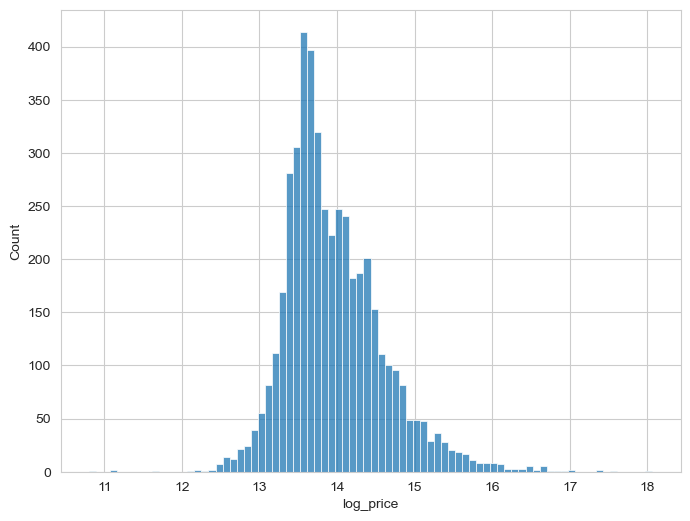

In [10]:
#sns.histplot(data = df, x ='PRICE')
plt.figure(figsize = (8,6))
sns.histplot(data = df, x = 'log_price')
plt.show()

In [11]:
df.head()

,SALE TYPE,PROPERTY TYPE,CITY,zipcode,PRICE,BEDS,BATHS,LOCATION,SQUARE FEET,LOT SIZE,...,DAYS ON MARKET,$/SQUARE FEET,LATITUDE,LONGITUDE,num_school,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price
0,PAST SALE,Single Family Residential,Auburn,98001,549950.0,3.0,2.0,Auburn,1340.0,9600.0,...,13.0,410.0,47.287207,-122.278138,11,1.454545,1.996248,28.96,60.0,13.217583
1,PAST SALE,Single Family Residential,Auburn,98001,819950.0,4.0,2.5,West Hill,2414.0,5872.0,...,1.0,340.0,47.326852,-122.261718,11,1.454545,1.996248,28.96,0.0,13.616999
2,PAST SALE,Single Family Residential,Auburn,98001,860675.0,5.0,3.5,West Hill,2853.0,6804.0,...,127.0,302.0,47.326852,-122.261718,11,1.454545,1.996248,28.96,1.0,13.665472
3,PAST SALE,Single Family Residential,Auburn,98001,879950.0,5.0,3.0,West Hill,2904.0,5446.0,...,1.0,303.0,47.326852,-122.261718,11,1.454545,1.996248,28.96,0.0,13.687620
4,PAST SALE,Single Family Residential,Auburn,98001,782700.0,4.0,2.5,West Hill,2039.0,4556.0,...,1.0,384.0,47.326852,-122.261718,11,1.454545,1.996248,28.96,0.0,13.570505


In [85]:
df_train, df_test = train_test_split(df.copy(), random_state = 123, test_size = 0.2) ##splitting the entire data set into raining and test sets

In [13]:
features = [i for i in df_train.columns] ##extracting all the features

features

['SALE TYPE',
 'PROPERTY TYPE',
 'CITY',
 'zipcode',
 'PRICE',
 'BEDS',
 'BATHS',
 'LOCATION',
 'SQUARE FEET',
 'LOT SIZE',
 'YEAR BUILT',
 'DAYS ON MARKET',
 '$/SQUARE FEET',
 'LATITUDE',
 'LONGITUDE',
 'num_school',
 'school_rating_mean',
 'Bayes_RatingSchool',
 'crime_percentage',
 'Age',
 'log_price']

In [14]:
##numerical features only (ignoring categorical for the time being)

num_features = [features[4], features[5], features[6], features[8], features[9], features[12], features[13],features[14], features[15], 
               features[16],features[17], features[18], features[19],features[20]]

In [15]:
num_features

['PRICE',
 'BEDS',
 'BATHS',
 'SQUARE FEET',
 'LOT SIZE',
 '$/SQUARE FEET',
 'LATITUDE',
 'LONGITUDE',
 'num_school',
 'school_rating_mean',
 'Bayes_RatingSchool',
 'crime_percentage',
 'Age',
 'log_price']

In [16]:
##make pairplots for everything; the digonal ones show the distribution

sns.pairplot(data = df_train, 
            x_vars = num_features, 
            y_vars = num_features,
            height=6)
plt.show() 

## Too big to handle, let's break it down a bit.

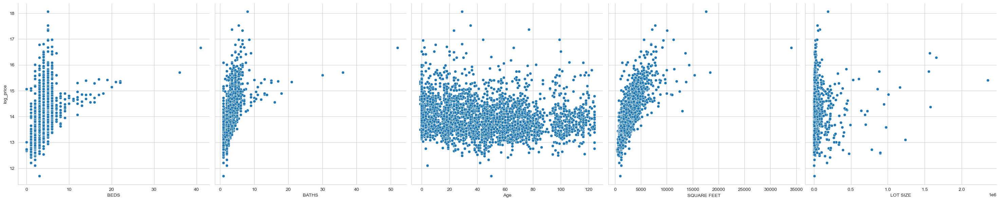

In [17]:
sns.pairplot(data = df_train, 
            x_vars = ['BEDS', 'BATHS', 'Age', 'SQUARE FEET', 'LOT SIZE'],
            y_vars = ['log_price'],
            height=6)
plt.show()

#### Will drop the multi-family units for a bit, to see if we can zoom in to the standard scenarios

In [18]:
df_train_std_bed_bath = df_train.loc[(df['PROPERTY TYPE'] != 'Multi-Family (5+ Unit)') & (df['PROPERTY TYPE'] != 'Multi-Family (2-4 Unit)')]

np.unique(df_train_std_bed_bath['PROPERTY TYPE'].values) ## Checking that we have dropped the multifamily ones

array(['Condo/Co-op', 'Mobile/Manufactured Home',
       'Single Family Residential', 'Townhouse'], dtype=object)

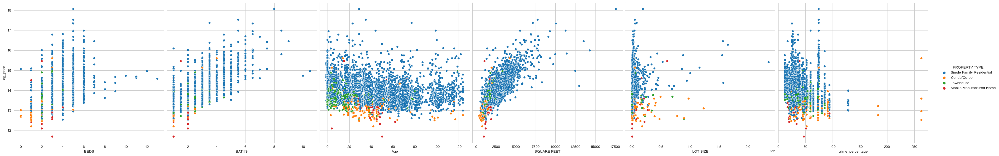

In [19]:
sns.pairplot(data = df_train_std_bed_bath, 
            x_vars = ['BEDS', 'BATHS', 'Age', 'SQUARE FEET', 'LOT SIZE', 'crime_percentage'],
            y_vars = ['log_price'],
             hue='PROPERTY TYPE',
            height=6)
plt.show()

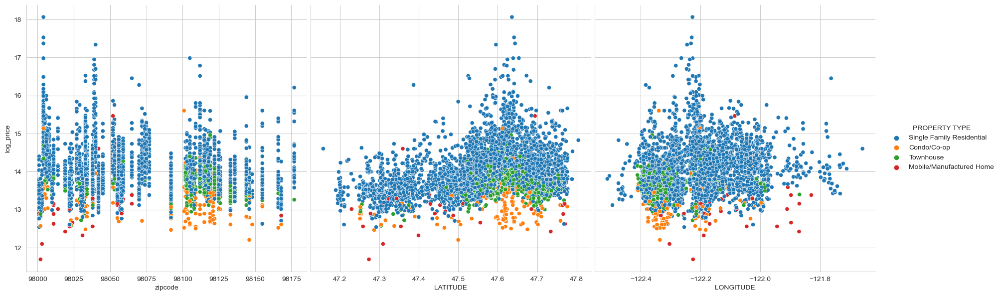

In [20]:
sns.pairplot(data = df_train_std_bed_bath, 
            x_vars = ['zipcode', 'LATITUDE', 'LONGITUDE'],
            y_vars = ['log_price'],
             hue='PROPERTY TYPE',
            height=6)
plt.show()

These plots show that there is a significant effect of the location on our data sets. So, we will definitely incorporate these into our model.

## Lineplots to see if there is interaction between categorical variables and some variables.

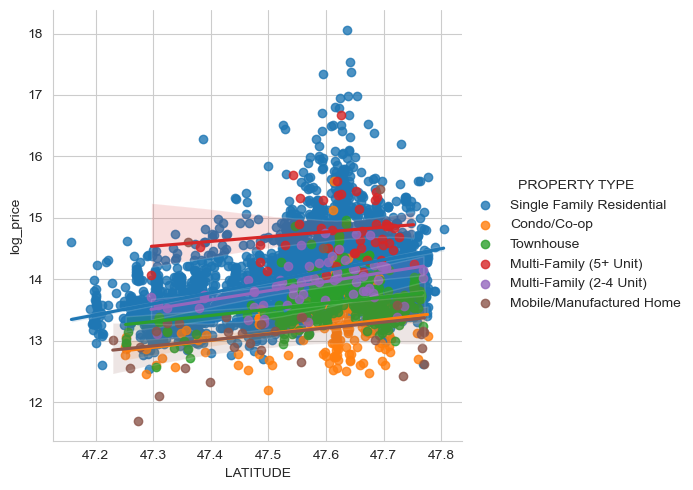

In [21]:
sns.lmplot(data= df_train,
          x='LATITUDE',
          y='log_price',
          hue='PROPERTY TYPE')

plt.show()

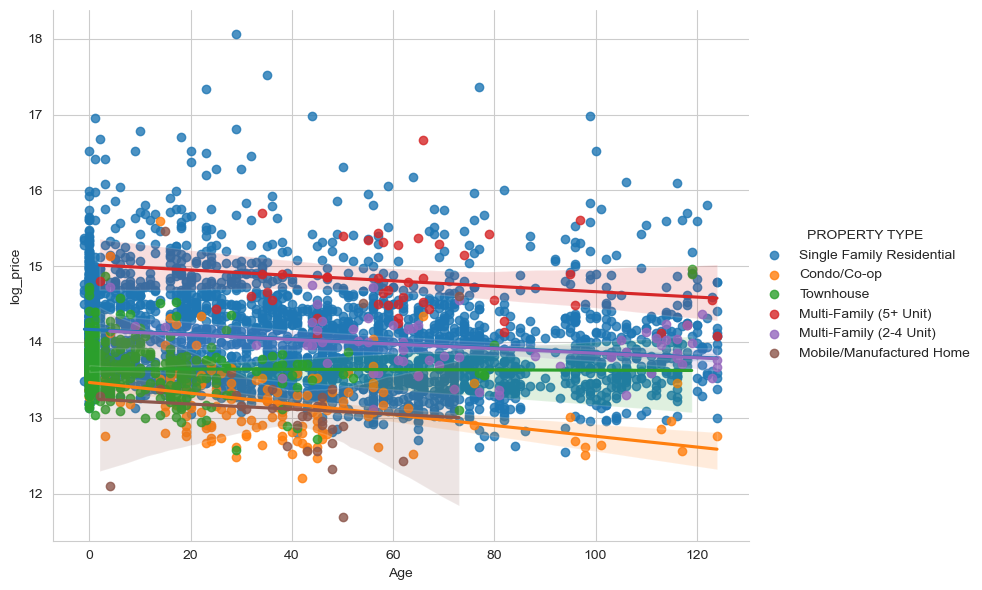

In [22]:
sns.lmplot(data = df_train,
            x='Age',
          y = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

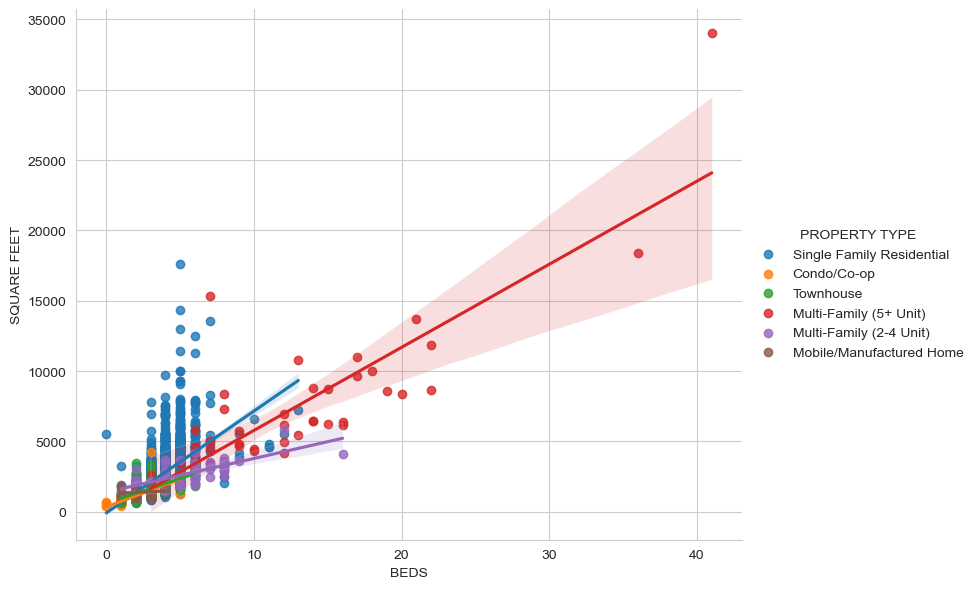

In [23]:
##SHowing high dependence of BEDS with square feet, using property type 

sns.lmplot(data = df_train,
            x='BEDS',
          y = 'SQUARE FEET',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show() 

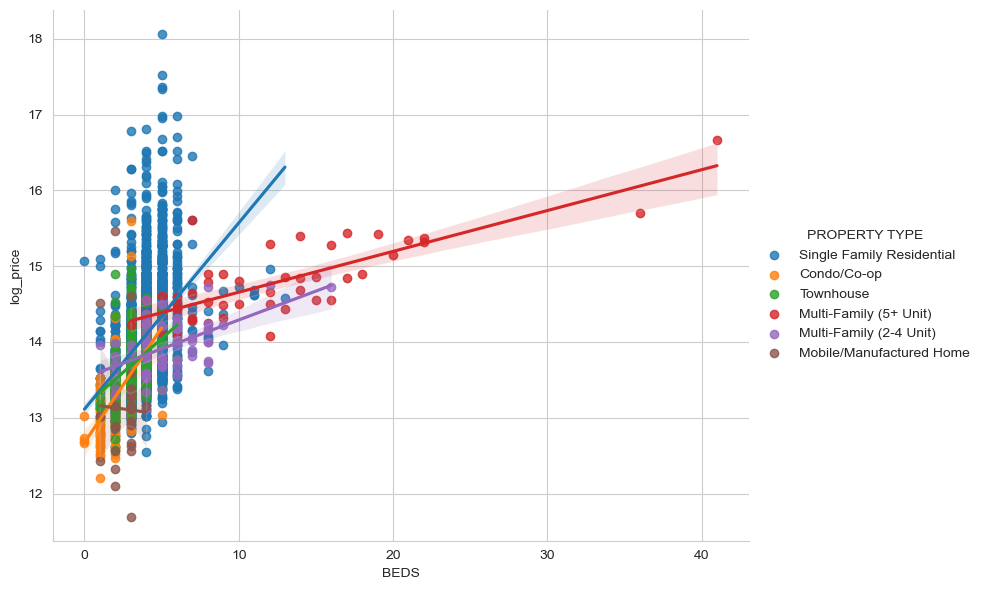

In [24]:
sns.lmplot(data = df_train,
            x='BEDS',
          y = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show() 

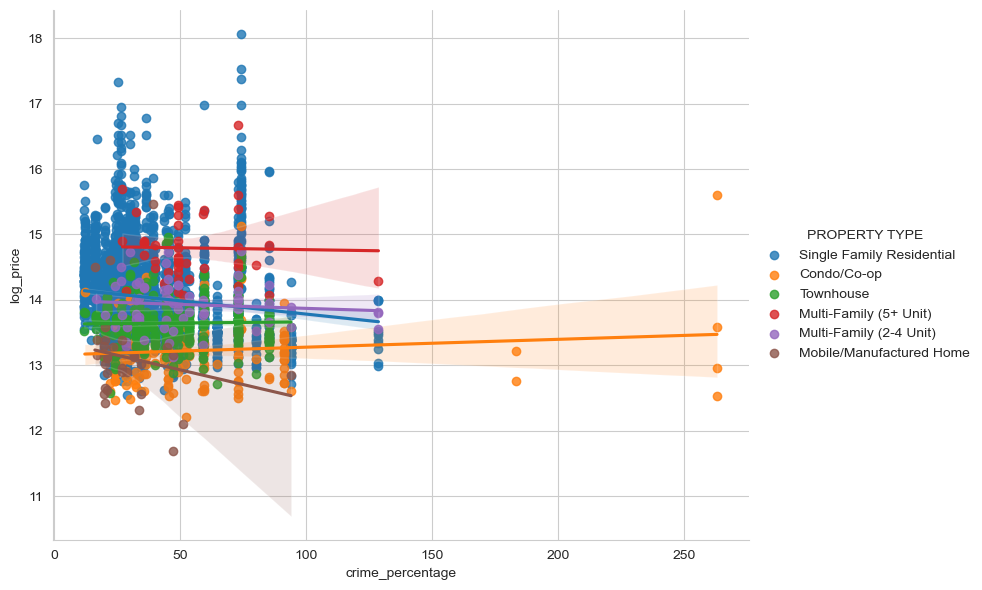

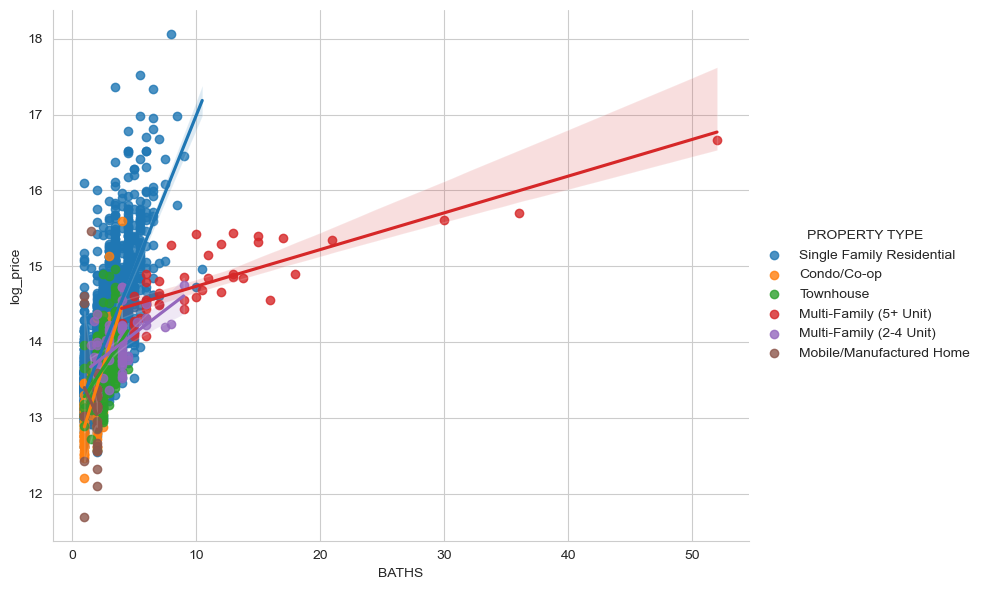

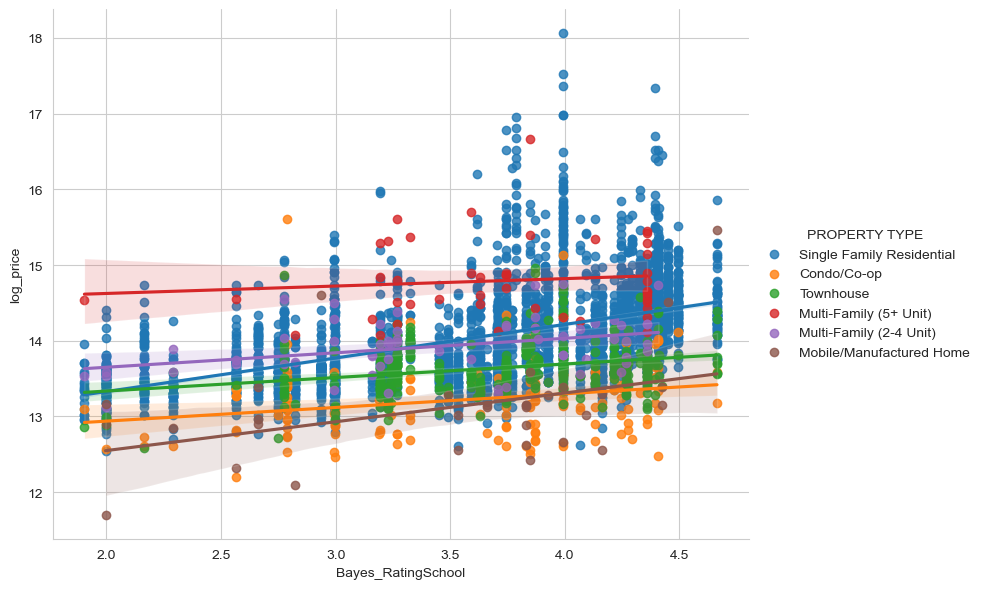

In [25]:
sns.lmplot(data = df_train,
            x='crime_percentage',
          y = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show() 


sns.lmplot(data = df_train,
            x='BATHS',
          y = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show() 

sns.lmplot(data = df_train,
            x='Bayes_RatingSchool',
          y = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show() 

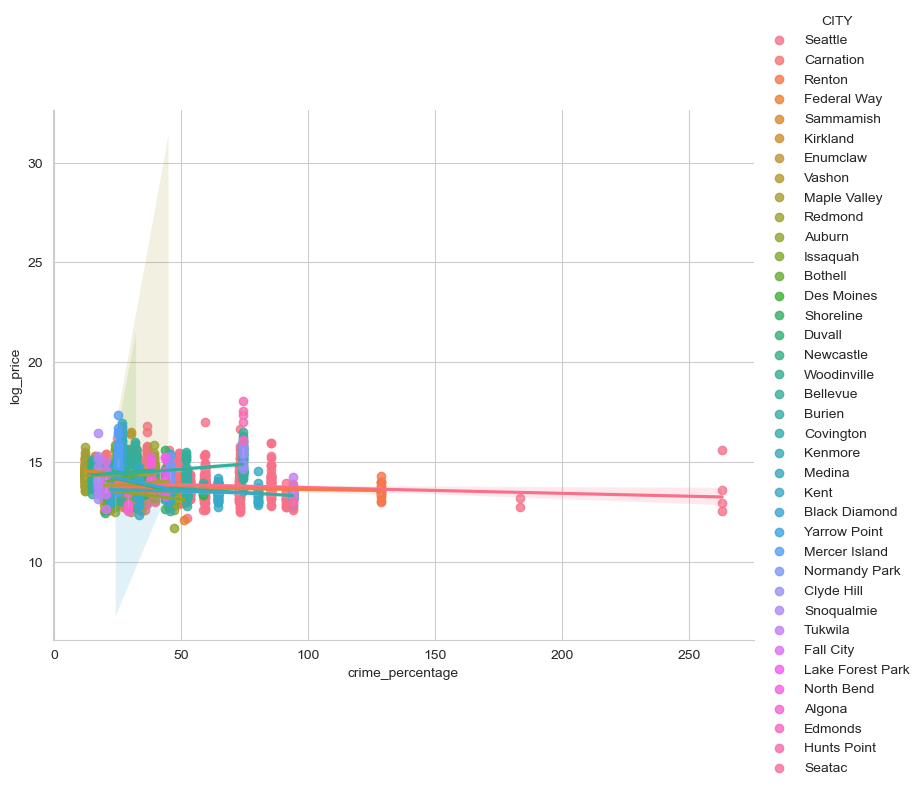

In [26]:
sns.lmplot(data = df_train,
            x='crime_percentage',
          y = 'log_price',
          hue='CITY',
          height = 6,
          aspect = 1.3)

plt.show() 

## More Pairplots

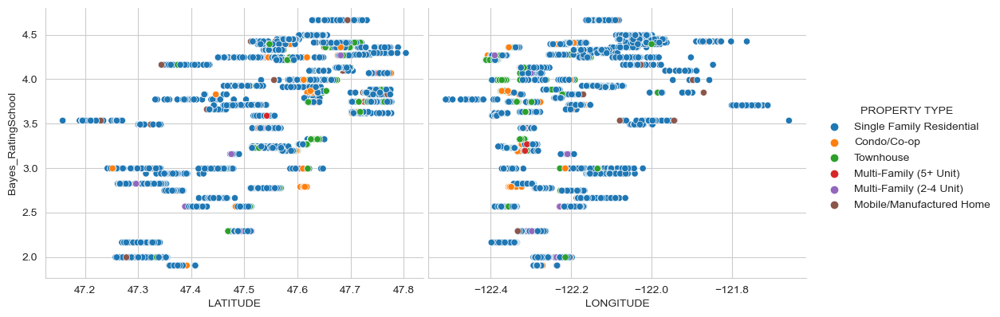

In [27]:
sns.pairplot(data = df_train,
            x_vars=['LATITUDE', 'LONGITUDE'],
          y_vars = 'Bayes_RatingSchool',
          hue='PROPERTY TYPE',
          height = 4,
          aspect = 1.3)

plt.show()

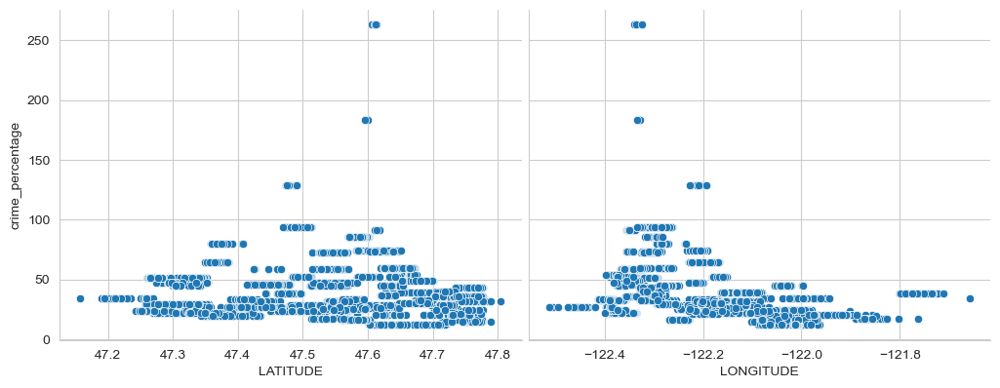

In [28]:
sns.pairplot(data = df_train,
            x_vars=['LATITUDE', 'LONGITUDE'],
          y_vars = 'crime_percentage',
          height = 4,
          aspect = 1.3)

plt.show()

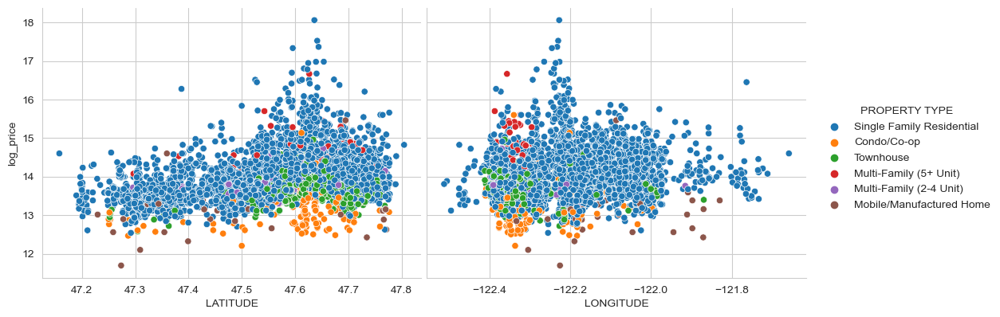

In [29]:
sns.pairplot(data = df_train,
            x_vars=['LATITUDE', 'LONGITUDE'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 4,
          aspect = 1.3)

plt.show()

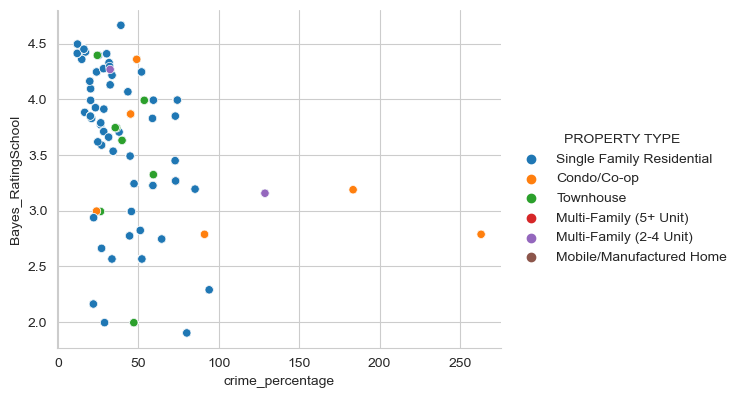

In [30]:
sns.pairplot(data = df_train,
            x_vars='crime_percentage',
          y_vars = 'Bayes_RatingSchool',
          hue='PROPERTY TYPE',
          height = 4,
          aspect = 1.3)

plt.show()

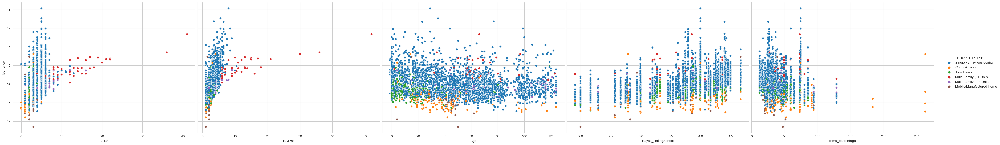

In [31]:
sns.pairplot(data = df_train,
            x_vars=['BEDS', 'BATHS', 'Age', 'Bayes_RatingSchool', 'crime_percentage'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

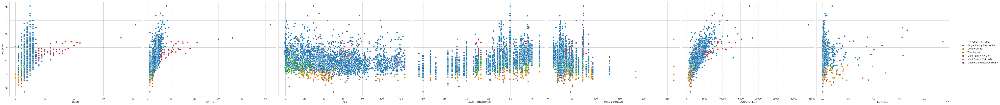

In [32]:
sns.pairplot(data = df_train,
            x_vars=['BEDS', 'BATHS', 'Age', 'Bayes_RatingSchool', 'crime_percentage', 'SQUARE FEET', 'LOT SIZE'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

## Trying a Quick Standard scaling here to see anything changes. BUt since everything was scaled, probably no changes expected.

In [33]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [34]:
scaler.fit(df_train[num_features])

StandardScaler()

In [35]:
df_scaled_array = scaler.transform(df_train[num_features])

In [36]:


df_train_scaled = pd.DataFrame(data  = df_scaled_array, index=df_train.index, columns=num_features)

In [37]:
## Adding back the categorical variables more or less

cat_features = ['SALE TYPE', 'PROPERTY TYPE', 'CITY', 'LOCATION', 'zipcode']

for feature in cat_features:
    df_train_scaled[feature] = df_train[feature]

In [38]:
df_train_scaled.head()

,PRICE,BEDS,BATHS,SQUARE FEET,LOT SIZE,$/SQUARE FEET,LATITUDE,LONGITUDE,num_school,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price,SALE TYPE,PROPERTY TYPE,CITY,LOCATION,zipcode
3321,-0.193251,0.175325,-0.170906,-0.372638,-0.217341,-0.034917,0.440684,-0.579899,-1.081057,0.244301,0.179805,-0.130278,2.011453,-0.077308,PAST SALE,Single Family Residential,Seattle,Madison Valley,98112
680,1.579953,-0.395430,0.416352,1.014389,5.302555,1.874016,0.526879,2.062000,-0.577243,0.711026,0.678252,-0.898230,0.167204,2.285003,MLS Listing,Single Family Residential,Carnation,Carnation,98014
2264,-0.407117,0.175325,-0.464535,-0.859083,-0.153914,-0.152433,-0.673312,0.265990,0.682293,-1.283162,-1.352173,-0.574807,0.801165,-0.946429,MLS Listing,Single Family Residential,Renton,Cascade,98058
4119,-0.147656,-0.395430,-0.464535,-0.504109,-0.191384,0.317634,0.106594,-1.196258,-1.081057,-0.689149,-0.529411,0.384065,1.060512,0.058698,PAST SALE,Single Family Residential,Seattle,Belvidere,98126
926,-0.416213,-0.395430,-0.464535,-0.582992,-0.168957,-0.576641,-1.688605,-1.031353,1.438015,-1.822623,-2.060502,-0.816543,0.138388,-0.996688,PAST SALE,Single Family Residential,Federal Way,Alderbrook,98023


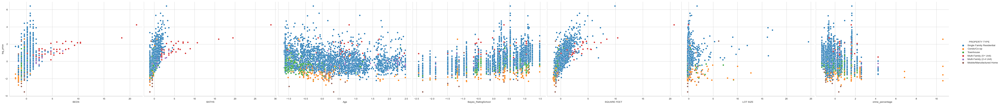

In [39]:
sns.pairplot(data = df_train_scaled,
            x_vars=['BEDS', 'BATHS', 'Age', 'Bayes_RatingSchool', 'SQUARE FEET', 'LOT SIZE', 'crime_percentage'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

#### Let's Drop the Multi-Family (5+ Unit) 

In [41]:
df1 = df_train_scaled.loc[df_train_scaled['PROPERTY TYPE'] != 'Multi-Family (5+ Unit)']

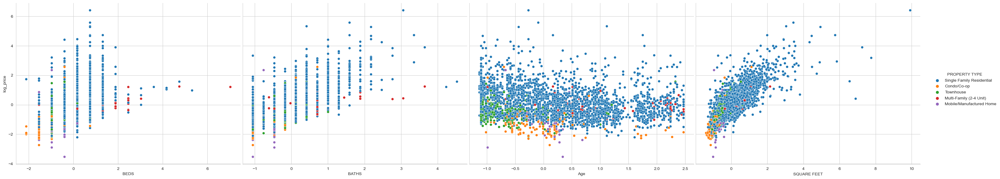

In [42]:
sns.pairplot(data = df1,
            x_vars=['BEDS', 'BATHS', 'Age', 'SQUARE FEET'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

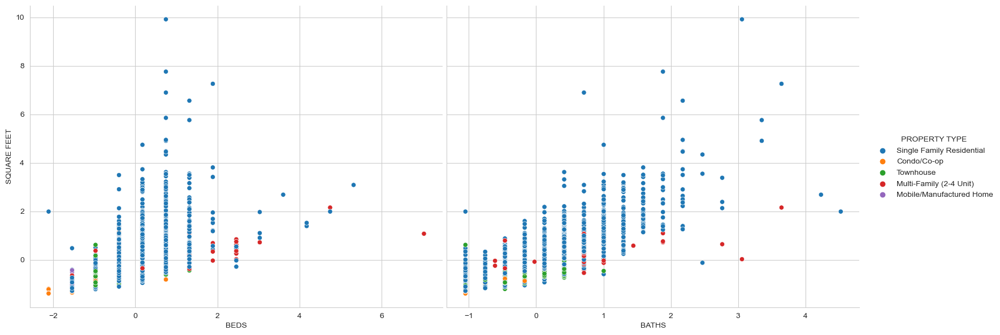

In [43]:
sns.pairplot(data = df1,
            x_vars=['BEDS', 'BATHS'],
          y_vars = 'SQUARE FEET',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

In [44]:
df_train[num_features].corr()

,PRICE,BEDS,BATHS,SQUARE FEET,LOT SIZE,$/SQUARE FEET,LATITUDE,LONGITUDE,num_school,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price
PRICE,1.000000,0.262169,0.399350,0.610351,0.129273,0.680075,0.155312,0.058431,-0.130614,0.229827,0.210636,-0.002419,-0.030984,0.714567
BEDS,0.262169,1.000000,0.795285,0.708977,-0.016709,-0.056692,0.001958,0.067728,0.036773,0.052376,0.036975,-0.068355,-0.013979,0.435481
BATHS,0.399350,0.795285,1.000000,0.804438,0.039654,0.068636,0.082618,0.065362,-0.058110,0.133894,0.120195,-0.043838,-0.139404,0.532247
SQUARE FEET,0.610351,0.708977,0.804438,1.000000,0.144418,0.138352,0.033549,0.164028,-0.053654,0.167489,0.150775,-0.109172,-0.071120,0.737365
LOT SIZE,0.129273,-0.016709,0.039654,0.144418,1.000000,0.092909,-0.049754,0.162907,0.010571,0.031225,0.033244,-0.088488,0.019329,0.119825
$/SQUARE FEET,0.680075,-0.056692,0.068636,0.138352,0.092909,1.000000,0.320728,-0.021110,-0.174601,0.334621,0.333707,0.046933,0.042358,0.594611
LATITUDE,0.155312,0.001958,0.082618,0.033549,-0.049754,0.320728,1.000000,-0.147901,-0.328104,0.617710,0.649112,-0.006401,0.051519,0.327031
LONGITUDE,0.058431,0.067728,0.065362,0.164028,0.162907,-0.021110,-0.147901,1.000000,0.044801,0.249694,0.260309,-0.421489,-0.234859,0.170961
num_school,-0.130614,0.036773,-0.058110,-0.053654,0.010571,-0.174601,-0.328104,0.044801,1.000000,-0.288592,-0.263043,-0.163191,-0.045876,-0.155565
school_rating_mean,0.229827,0.052376,0.133894,0.167489,0.031225,0.334621,0.617710,0.249694,-0.288592,1.000000,0.969259,-0.359772,-0.043086,0.452566


In [45]:
len(df_train.loc[df['PROPERTY TYPE'] == 'Multi-Family (5+ Unit)'].index)

45

In [46]:
## Drop both the multi famil options

df2 = df1.loc[df1['PROPERTY TYPE'] != 'Multi-Family (2-4 Unit)'].copy()

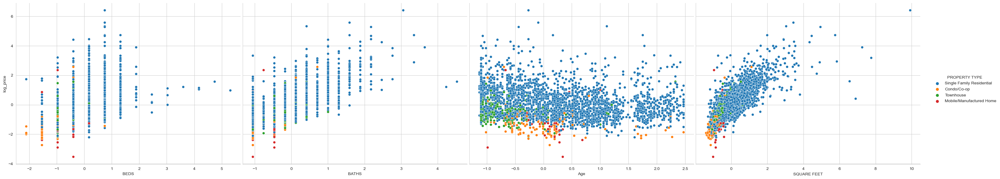

In [47]:
sns.pairplot(data = df2,
            x_vars=['BEDS', 'BATHS', 'Age', 'SQUARE FEET'],
          y_vars = 'log_price',
          hue='PROPERTY TYPE',
          height = 6,
          aspect = 1.3)

plt.show()

In [48]:
df_train.groupby(['PROPERTY TYPE']).log_price.mean()

PROPERTY TYPE
Condo/Co-op                  13.226711
Mobile/Manufactured Home     13.115097
Multi-Family (2-4 Unit)      13.928730
Multi-Family (5+ Unit)       14.794457
Single Family Residential    14.039860
Townhouse                    13.645115
Name: log_price, dtype: float64

In [49]:
df_train['BEDS'].sort_values()

4136     0.0
2851     0.0
3886     0.0
2825     0.0
3836     0.0
        ... 
3471    21.0
2845    22.0
3136    22.0
4293    36.0
3279    41.0
Name: BEDS, Length: 3760, dtype: float64

In [50]:
df_train.groupby(['SALE TYPE']).log_price.mean()

SALE TYPE
For-Sale-by-Owner Listing    13.723835
MLS Listing                  14.012267
New Construction Home        14.226345
PAST SALE                    13.903990
Name: log_price, dtype: float64

In [51]:
df_train.groupby(['LOCATION']).log_price.mean()

LOCATION
5 Mile Lake        13.353396
Adelaide           13.383188
Admiral            13.658439
Alaska Junction    13.558612
Aldarra            14.587560
                     ...    
Wood River         14.187074
Woodinville        14.341222
Woodland Park      13.878044
Woodridge          13.945274
Yarrow Point       15.657902
Name: log_price, Length: 467, dtype: float64

In [52]:
df_train.groupby(['CITY']).log_price.mean()

CITY
Algona              13.002611
Auburn              13.430033
Bellevue            14.567795
Black Diamond       13.666188
Bothell             14.034003
Burien              13.579176
Carnation           14.393903
Clyde Hill          15.510384
Covington           13.569159
Des Moines          13.551600
Duvall              13.792406
Edmonds             13.909001
Enumclaw            13.547803
Fall City           13.962361
Federal Way         13.527961
Hunts Point         17.210795
Issaquah            14.244671
Kenmore             14.069406
Kent                13.538095
Kirkland            14.365902
Lake Forest Park    13.986609
Maple Valley        13.815218
Medina              15.814353
Mercer Island       14.944686
Newcastle           14.389729
Normandy Park       14.294296
North Bend          14.021601
Redmond             14.346388
Renton              13.730536
Sammamish           14.528329
Seatac              12.945452
Seattle             13.855870
Shoreline           13.827995
Snoqu

In [53]:
df.groupby(['CITY']).log_price.mean()

CITY
Algona              13.045724
Auburn              13.441011
Bellevue            14.572189
Black Diamond       13.660585
Bothell             13.998167
Burien              13.570842
Carnation           14.304478
Clyde Hill          15.493177
Covington           13.563234
Des Moines          13.529285
Duvall              13.787131
Edmonds             13.909001
Enumclaw            13.541719
Fall City           13.964152
Federal Way         13.522778
Hunts Point         17.210795
Issaquah            14.247228
Kenmore             13.980309
Kent                13.543935
Kirkland            14.412314
Lake Forest Park    13.971977
Maple Valley        13.781670
Medina              15.869128
Mercer Island       14.959293
Newcastle           14.396221
Normandy Park       14.213234
North Bend          14.004639
Redmond             14.351811
Renton              13.716363
Sammamish           14.499481
Seatac              13.104458
Seattle             13.854899
Shoreline           13.836522
Snoqu

## BoxPlots

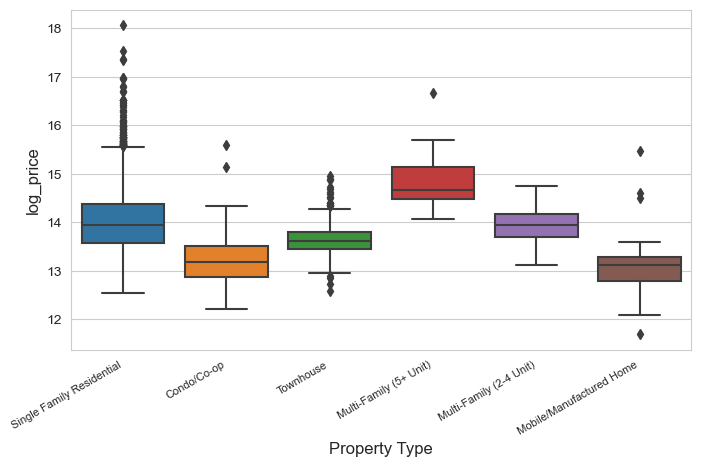

In [54]:
plt.figure(figsize = (8,5))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='PROPERTY TYPE',
           )

plt.xlabel('Property Type', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

Property type does have an influence on the price and we can try one-hot encoding for the 6 property types in our models. 

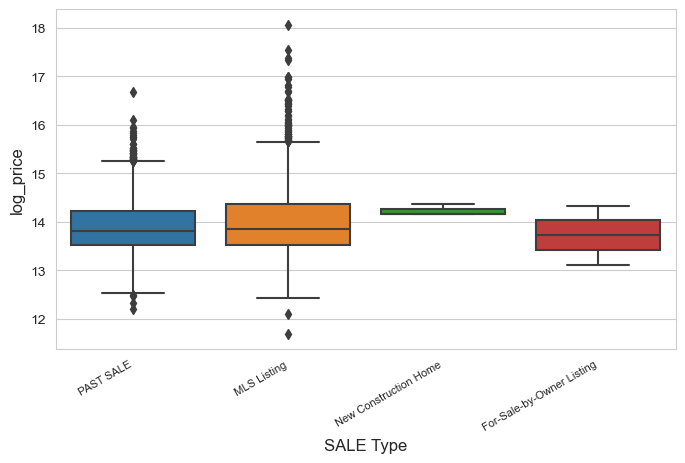

In [55]:
plt.figure(figsize = (8,5))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='SALE TYPE',
           )

plt.xlabel('SALE Type', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

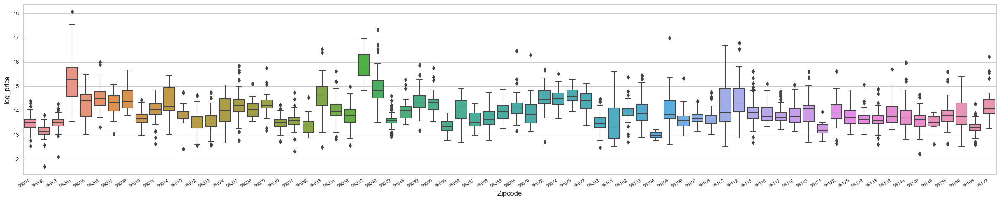

In [56]:
plt.figure(figsize = (30,6))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='zipcode',
           )

plt.xlabel('Zipcode', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

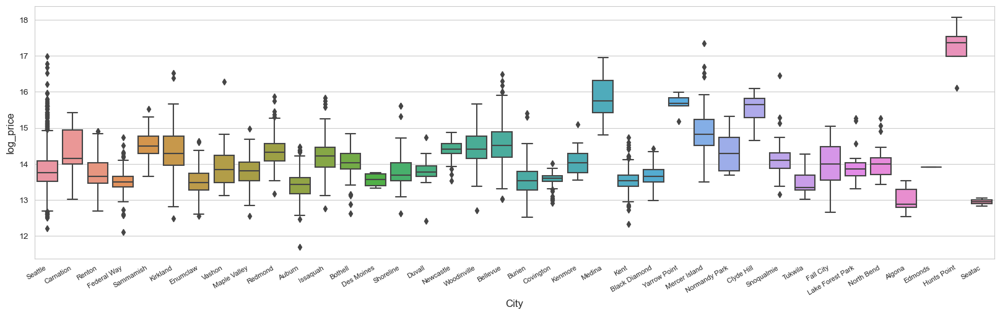

In [57]:
plt.figure(figsize = (20,6))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='CITY',
           )

plt.xlabel('City', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

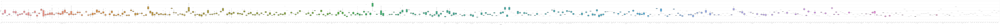

In [58]:
plt.figure(figsize = (400,10))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='LOCATION',
           )

plt.xlabel('Location', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

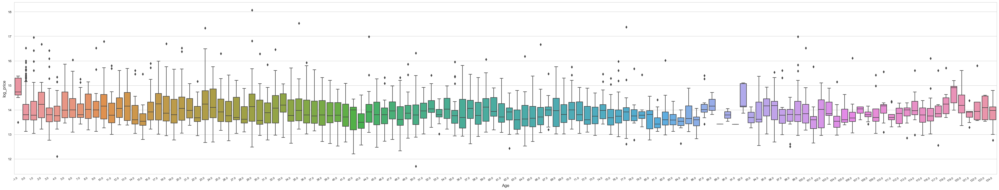

In [59]:
plt.figure(figsize = (50,10))

sns.boxplot(data = df_train,
           y = 'log_price',
           x='Age',
           )

plt.xlabel('Age', fontsize = 12)
plt.xticks(fontsize = 8)

plt.ylabel('log_price', fontsize = 12)
plt.yticks(fontsize = 10)

plt.gcf().autofmt_xdate()

plt.show()

In [65]:
df_sorted = df_train.sort_values(by='PRICE', ascending=False)
df_sorted 

,SALE TYPE,PROPERTY TYPE,CITY,zipcode,PRICE,BEDS,BATHS,LOCATION,SQUARE FEET,LOT SIZE,...,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price,Condo,Single Family,Townhouse,Multi_Family4,Multi_Family5
259,MLS Listing,Single Family Residential,Hunts Point,98004,41000000.0,5.0,5.5,Hunts Point,7750.0,48321.0,...,4.500000,3.992964,74.23,35.0,17.529083,0,1,0,0,0
311,MLS Listing,Single Family Residential,Hunts Point,98004,34998000.0,5.0,3.5,Hunts Point,7140.0,80931.0,...,4.500000,3.992964,74.23,77.0,17.370801,0,1,0,0,0
1731,MLS Listing,Single Family Residential,Mercer Island,98040,33900000.0,5.0,6.5,North End,10030.0,54286.0,...,5.000000,4.394371,25.18,23.0,17.338926,0,1,0,0,0
3034,MLS Listing,Single Family Residential,Seattle,98105,23800000.0,6.0,8.5,University District,11271.0,43068.0,...,4.666667,3.991959,59.33,99.0,16.985196,0,1,0,0,0
310,MLS Listing,Single Family Residential,Hunts Point,98004,23725000.0,5.0,5.5,Hunts Point,5540.0,33452.0,...,4.500000,3.992964,74.23,44.0,16.982040,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765,MLS Listing,Mobile/Manufactured Home,Duvall,98019,249000.0,1.0,1.0,Duvall,1200.0,216057.0,...,4.333333,3.849102,20.14,62.0,12.425208,0,0,0,0,0
1240,PAST SALE,Mobile/Manufactured Home,Kent,98031,225000.0,2.0,2.0,East Hill,1160.0,5073.0,...,2.200000,2.567408,33.56,48.0,12.323856,0,0,0,0,0
4449,PAST SALE,Condo/Co-op,Seattle,98146,199999.0,1.0,1.0,West Seattle,774.0,176636.0,...,2.200000,2.567408,52.17,42.0,12.206068,1,0,0,0,0
228,MLS Listing,Mobile/Manufactured Home,Federal Way,98003,179900.0,2.0,2.0,Federal Way,1200.0,3200.0,...,2.684211,2.823640,51.17,4.0,12.100156,0,0,0,0,0


Based on the data analysis above we decide to delete the row with the maximum price. Because there is a big gap between this price and the next largest price and it acts as an outlier in the data set. 

In [86]:
df_train = df_train[df_train['PRICE'] <= 41000000]
df_train

,SALE TYPE,PROPERTY TYPE,CITY,zipcode,PRICE,BEDS,BATHS,LOCATION,SQUARE FEET,LOT SIZE,...,DAYS ON MARKET,$/SQUARE FEET,LATITUDE,LONGITUDE,num_school,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price
3321,PAST SALE,Single Family Residential,Seattle,98112,1099000.0,4.0,2.5,Madison Valley,1940.0,2602.0,...,7.0,566.0,47.619864,-122.295070,4,4.000000,3.742964,36.46,108.0,6.040998
680,MLS Listing,Single Family Residential,Carnation,98014,4988000.0,3.0,3.5,Carnation,4050.0,528076.0,...,27.0,1232.0,47.632233,-121.939949,6,4.500000,4.094371,20.29,44.0,6.697926
2264,MLS Listing,Single Family Residential,Renton,98058,629950.0,4.0,2.0,Cascade,1200.0,8640.0,...,39.0,525.0,47.459994,-122.181367,11,2.363636,2.662914,27.10,66.0,5.799306
4119,PAST SALE,Single Family Residential,Seattle,98126,1199000.0,3.0,2.0,Belvidere,1740.0,5073.0,...,13.0,689.0,47.571918,-122.377921,4,3.000000,3.242964,47.29,75.0,6.078819
926,PAST SALE,Single Family Residential,Federal Way,98023,610000.0,3.0,2.0,Alderbrook,1620.0,7208.0,...,7.0,377.0,47.314290,-122.355754,14,1.785714,2.163540,22.01,43.0,5.785330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,PAST SALE,Single Family Residential,Maple Valley,98038,700000.0,3.0,2.5,Maple Valley,1790.0,5000.0,...,6.0,391.0,47.361424,-122.034582,8,4.500000,4.161976,19.77,19.0,5.845098
4060,PAST SALE,Townhouse,Seattle,98125,589900.0,2.0,2.0,Pinehurst,1080.0,726.0,...,38.0,546.0,47.718291,-122.313788,7,3.714286,3.631247,39.83,0.0,5.770778
1346,PAST SALE,Single Family Residential,Kirkland,98033,3500000.0,5.0,5.5,Rose Hill,4552.0,9600.0,...,1.0,769.0,47.691734,-122.162944,13,4.692308,4.408454,30.27,0.0,6.544068
3454,MLS Listing,Single Family Residential,Seattle,98115,1799000.0,5.0,1.0,Green Lake,3020.0,4500.0,...,20.0,596.0,47.677427,-122.324882,11,4.363636,4.129581,32.44,103.0,6.255031


To prepare the data set for modling we apply one hot encoding for the categorical variable PROPERTY TYPE



In [87]:
##one hot encoding for the various property types on the training set.

df_train['Condo'] = 1*pd.get_dummies(df_train['PROPERTY TYPE'])['Condo/Co-op']
df_train['Single Family'] = 1*pd.get_dummies(df_train['PROPERTY TYPE'])['Single Family Residential']
df_train['Townhouse'] = 1*pd.get_dummies(df_train['PROPERTY TYPE'])['Townhouse']
df_train['Multi_Family4'] = 1*pd.get_dummies(df_train['PROPERTY TYPE'])['Multi-Family (2-4 Unit)']
df_train['Multi_Family5'] = 1*pd.get_dummies(df_train['PROPERTY TYPE'])['Multi-Family (5+ Unit)']

##one hot encoding for the various property types on the testing set.

df_test['Condo'] = 1*pd.get_dummies(df_test['PROPERTY TYPE'])['Condo/Co-op']
df_test['Single Family'] = 1*pd.get_dummies(df_test['PROPERTY TYPE'])['Single Family Residential']
df_test['Townhouse'] = 1*pd.get_dummies(df_test['PROPERTY TYPE'])['Townhouse']
df_test['Multi_Family4'] = 1*pd.get_dummies(df_test['PROPERTY TYPE'])['Multi-Family (2-4 Unit)']
df_test['Multi_Family5'] = 1*pd.get_dummies(df_test['PROPERTY TYPE'])['Multi-Family (5+ Unit)']

In [88]:
# save the prepared train data set for modeling 
df_train.to_csv('data\TRAIN_SET.csv', index=False)

# save the prepared train data set for modeling 
df_test.to_csv('data\TEST_SET.csv', index=False)

In [89]:
df_train

,SALE TYPE,PROPERTY TYPE,CITY,zipcode,PRICE,BEDS,BATHS,LOCATION,SQUARE FEET,LOT SIZE,...,school_rating_mean,Bayes_RatingSchool,crime_percentage,Age,log_price,Condo,Single Family,Townhouse,Multi_Family4,Multi_Family5
3321,PAST SALE,Single Family Residential,Seattle,98112,1099000.0,4.0,2.5,Madison Valley,1940.0,2602.0,...,4.000000,3.742964,36.46,108.0,6.040998,0,1,0,0,0
680,MLS Listing,Single Family Residential,Carnation,98014,4988000.0,3.0,3.5,Carnation,4050.0,528076.0,...,4.500000,4.094371,20.29,44.0,6.697926,0,1,0,0,0
2264,MLS Listing,Single Family Residential,Renton,98058,629950.0,4.0,2.0,Cascade,1200.0,8640.0,...,2.363636,2.662914,27.10,66.0,5.799306,0,1,0,0,0
4119,PAST SALE,Single Family Residential,Seattle,98126,1199000.0,3.0,2.0,Belvidere,1740.0,5073.0,...,3.000000,3.242964,47.29,75.0,6.078819,0,1,0,0,0
926,PAST SALE,Single Family Residential,Federal Way,98023,610000.0,3.0,2.0,Alderbrook,1620.0,7208.0,...,1.785714,2.163540,22.01,43.0,5.785330,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,PAST SALE,Single Family Residential,Maple Valley,98038,700000.0,3.0,2.5,Maple Valley,1790.0,5000.0,...,4.500000,4.161976,19.77,19.0,5.845098,0,1,0,0,0
4060,PAST SALE,Townhouse,Seattle,98125,589900.0,2.0,2.0,Pinehurst,1080.0,726.0,...,3.714286,3.631247,39.83,0.0,5.770778,0,0,1,0,0
1346,PAST SALE,Single Family Residential,Kirkland,98033,3500000.0,5.0,5.5,Rose Hill,4552.0,9600.0,...,4.692308,4.408454,30.27,0.0,6.544068,0,1,0,0,0
3454,MLS Listing,Single Family Residential,Seattle,98115,1799000.0,5.0,1.0,Green Lake,3020.0,4500.0,...,4.363636,4.129581,32.44,103.0,6.255031,0,1,0,0,0
